## New york :
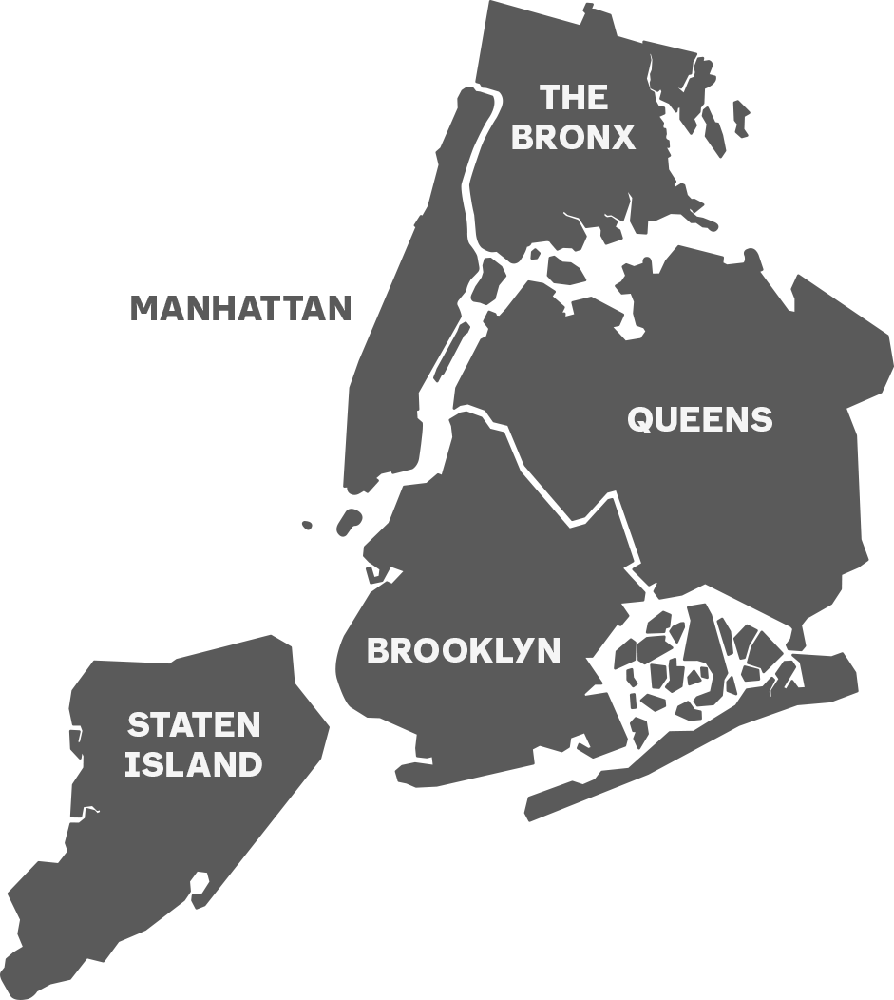

In [1]:
#Use dask to read only necessary columns at a time. Speed up EDA
import dask.dataframe as dd#similar to pandas
import pandas as pd#pandas to create small dataframes 
import folium#open street map
import datetime#Convert to unix time
import time#Convert to unix time
import numpy as np#Do aritmetic operations on arrays
import seaborn as sns#Plots
import matplotlib.pylab as plt#Plots
import matplotlib  #Plots
from matplotlib import rcParams#Size of plots  
import gpxpy.geo#Get the haversine distance
from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering

In [2]:
#There are 19 columns
month_1 = dd.read_csv('yellow_tripdata_2015-01.csv')
print month_1.columns

Index([u'VendorID', u'tpep_pickup_datetime', u'tpep_dropoff_datetime',
       u'passenger_count', u'trip_distance', u'pickup_longitude',
       u'pickup_latitude', u'RateCodeID', u'store_and_fwd_flag',
       u'dropoff_longitude', u'dropoff_latitude', u'payment_type',
       u'fare_amount', u'extra', u'mta_tax', u'tip_amount', u'tolls_amount',
       u'improvement_surcharge', u'total_amount'],
      dtype='object')


# Data Information

<ul>The yellow and green taxi trip records include fields capturing 
    <li>pick-up and drop-off dates/times, </li>
    <li>pick-up and drop-off locations, </li>
    <li>trip distances, </li>
    <li>itemized fares, </li>
    <li>rate types, </li>
    <li>payment types,</li>
    <li>driver-reported passenger counts. </li>
</ul>
<p>
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) 
</p>

## Information on taxis:

<h5> Yellow Taxi: Yellow Medallion Taxicabs</h5>
<p> These are the famous NYC yellow taxis that provide transportation exclusively through street-hails. The number of taxicabs is limited by a finite number of medallions issued by the TLC. You access this mode of transportation by standing in the street and hailing an available taxi with your hand. The pickups are not pre-arranged.</p>

<h5> For Hire Vehicles (FHVs) </h5>
<p> FHV transportation is accessed by a pre-arrangement with a dispatcher or limo company. These FHVs are not permitted to pick up passengers via street hails, as those rides are not considered pre-arranged. </p>

<h5> Green Taxi: Street Hail Livery (SHL) </h5>
<p>  The SHL program will allow livery vehicle owners to license and outfit their vehicles with green borough taxi branding, meters, credit card machines, and ultimately the right to accept street hails in addition to pre-arranged rides. </p>
<p> Credits: Quora</p>

<h5>Footnote:</h5>
In the given notebook we are considering only the yellow taxis for the year of 2015

# Data Collection
We Have collected all yellow taxi trips data from jan-2015 to dec-2016(Will be using only 2015 data)
<table>
<tr>
<th> file name </th>
<th> file name size</th>
<th> number of records </th>
<th> number of features </th>
<th> number of samples </th>
</tr>
<tr>
<td> yellow_tripdata_2016-01 </td>
<td> 1. 59G </td>
<td> 10906858 </td>
<td> 19 </td>
<td> $454452$ </td>
</tr>

<tr>
<td> yellow_tripdata_2016-02 </td>
<td> 1. 66G </td>
<td> 11382049 </td>
<td> 19 </td>
<td> $474252$ </td>
</tr>
<tr>
<td> yellow_tripdata_2016-03 </td>
<td> 1. 78G </td>
<td> 12210952 </td>
<td> 19 </td>
<td> $508789$ </td>
</tr>
<tr>
<td> yellow_tripdata_2016-04 </td>
<td> 1. 74G </td>
<td> 11934338 </td>
<td> 19 </td>
<td> $497264$ </td>
</tr>

<tr>
<td> yellow_tripdata_2016-05 </td>
<td> 1. 73G </td>
<td> 11836853 </td>
<td> 19 </td>
<td> $493202$ </td>
</tr>

<tr>
<td> yellow_tripdata_2016-06 </td>
<td> 1. 62G </td>
<td> 11135470 </td>
<td> 19 </td>
<td> $463977$ </td>
</tr>

<tr>
<td> yellow_tripdata_2016-07 </td>
<td> 884Mb </td>
<td> 10294080 </td>
<td> 17 </td>
<td> $428920$ </td>
</tr>

<tr>
<td> yellow_tripdata_2016-08 </td>
<td> 854Mb </td>
<td> 9942263 </td>
<td> 17 </td>
<td> $414260$ </td>
</tr>

<tr>
<td> yellow_tripdata_2016-09 </td>
<td> 870Mb </td>
<td> 10116018 </td>
<td> 17 </td>
<td> $421500$ </td>
</tr>

<tr>
<td> yellow_tripdata_2016-10 </td>
<td> 933Mb </td>
<td> 10854626 </td>
<td> 17 </td>
<td> $452276$ </td>
</tr>
<tr>
<td> yellow_tripdata_2016-11 </td>
<td> 868Mb </td>
<td> 10102128 </td>
<td> 17 </td>
<td> $420922$ </td>
</tr>
<tr>
<td> yellow_tripdata_2016-12 </td>
<td> 897Mb </td>
<td> 10449408 </td>
<td> 17 </td>
<td> $435392$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-01 </td>
<td> 1.84Gb </td>
<td> 12748986 </td>
<td> 19 </td>
<td> $531207$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-02 </td>
<td> 1.81Gb </td>
<td> 12450521 </td>
<td> 19 </td>
<td> $518771$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-03 </td>
<td> 1.94Gb </td>
<td> 13351609 </td>
<td> 19 </td>
<td> $556317$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-04 </td>
<td> 1.90Gb </td>
<td> 13071789 </td>
<td> 19 </td>
<td> $544657$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-05 </td>
<td> 1.91Gb </td>
<td> 13158262 </td>
<td> 19 </td>
<td> $548260$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-06 </td>
<td> 1.79Gb </td>
<td> 12324935 </td>
<td> 19 </td>
<td> $513538$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-07 </td>
<td> 1.68Gb </td>
<td> 11562783 </td>
<td> 19 </td>
<td> $481782$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-08 </td>
<td> 1.62Gb </td>
<td> 11130304 </td>
<td> 19 </td>
<td> $463762$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-09 </td>
<td> 1.63Gb </td>
<td> 11225063 </td>
<td> 19 </td>
<td> $467710$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-10 </td>
<td> 1.79Gb </td>
<td> 12315488 </td>
<td> 19 </td>
<td> $513145$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-11 </td>
<td> 1.65Gb </td>
<td> 11312676 </td>
<td> 19 </td>
<td> $471361$ </td>
</tr>
<tr>
<td> yellow_tripdata_2015-12 </td>
<td> 1.67Gb </td>
<td> 11460573 </td>
<td> 19 </td>
<td> $477523$ </td>
</tr>
</table>

## Features in the dataset:
<table border="1">
	<tr>
		<th>Field Name</th>
		<th>Description</th>
	</tr>
	<tr>
		<td>VendorID</td>
		<td>
		A code indicating the TPEP provider that provided the record.
		<ol>
			<li>Creative Mobile Technologies</li>
			<li>VeriFone Inc.</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>tpep_pickup_datetime</td>
		<td>The date and time when the meter was engaged.</td>
	</tr>
	<tr>
		<td>tpep_dropoff_datetime</td>
		<td>The date and time when the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Passenger_count</td>
		<td>The number of passengers in the vehicle. This is a driver-entered value.</td>
	</tr>
	<tr>
		<td>Trip_distance</td>
		<td>The elapsed trip distance in miles reported by the taximeter.</td>
	</tr>
	<tr>
		<td>Pickup_longitude</td>
		<td>Longitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>Pickup_latitude</td>
		<td>Latitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>RateCodeID</td>
		<td>The final rate code in effect at the end of the trip.
		<ol>
			<li> Standard rate </li>
			<li> JFK </li>
			<li> Newark </li>
			<li> Nassau or Westchester</li>
			<li> Negotiated fare </li>
			<li> Group ride</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Store_and_fwd_flag</td>
		<td>This flag indicates whether the trip record was held in vehicle memory before sending to the vendor,<br\> aka “store and forward,” because the vehicle did not have a connection to the server.
		<br\>Y= store and forward trip
		<br\>N= not a store and forward trip
		</td>
	</tr>

	<tr>
		<td>Dropoff_longitude</td>
		<td>Longitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Dropoff_ latitude</td>
		<td>Latitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Payment_type</td>
		<td>A numeric code signifying how the passenger paid for the trip.
		<ol>
			<li> Credit card </li>
			<li> Cash </li>
			<li> No charge </li>
			<li> Dispute</li>
			<li> Unknown </li>
			<li> Voided trip</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Fare_amount</td>
		<td>The time-and-distance fare calculated by the meter.</td>
	</tr>
	<tr>
		<td>Extra</td>
		<td>Miscellaneous extras and surcharges. Currently, this only includes. the $0.50 and $1 rush hour and overnight charges.</td>
	</tr>
	<tr>
		<td>MTA_tax</td>
		<td>0.50 MTA tax that is automatically triggered based on the metered rate in use.</td>
	</tr>
	<tr>
		<td>Improvement_surcharge</td>
		<td>0.30 improvement surcharge assessed trips at the flag drop. the improvement surcharge began being levied in 2015.</td>
	</tr>
	<tr>
		<td>Tip_amount</td>
		<td>Tip amount – This field is automatically populated for credit card tips.Cash tips are not included.</td>
	</tr>
	<tr>
		<td>Tolls_amount</td>
		<td>Total amount of all tolls paid in trip.</td>
	</tr>
	<tr>
		<td>Total_amount</td>
		<td>The total amount charged to passengers. Does not include cash tips.</td>
	</tr>
</table>

In [3]:
samples = 12748986+12450521+13351609+13071789+13158262+12324935+11562783+11130304+11225063+12315488+11312676+11460573
print samples

146112989


### Total number of samples for the year of 2015:
 - 146 million  

# Problem statement
<h3> Find out the pick up density give the time and a region.</h3>
<p> 
We will be taking the data of year 2015(12 months data) as train data, and test our model on year 2016 data.
</p>

## EDA for the months JAN - DEC
### Eventful days in january:
1. Thursday        :January 01	 New Years Day	
2. Monday	       :January 19	 Martin Luther King Jr. Day	Third Monday in January
3. Sunday-Tuesday  :January 25-27 Blizzard shuts down city
 
### Eventful days in february:
3. Thursday	:February 12	Lincoln's Birthday
4. Monday	:February 16	Presidents' Day	



In [4]:
month_1.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


## Exploring features :
1. Vendor ID
2. Passenger counts
3. Rate Code ID
4. store and forward flags
5. Payment types

## Samples for each month:
1. January  :12.7 Million
2. February :12.4 Million	
3. March    :13.3 Million
4. April    :13.1 Million
5.
6.



## New york bounding box:
1. min_lat <- 40.5774
2. max_lat <- 40.9176
3. min_long <- -74.15
4. max_long <- -73.7004

## Removing the points outside of new york:

In [5]:
#Doesn't remove outliers
#Prints number of outliers in the datframe
def outlier_locations():
    outlier_frame = month_1[['dropoff_longitude','dropoff_latitude','pickup_longitude','pickup_latitude']].compute()
    data = outlier_frame.shape[0]
    outliers_dropoff = outlier_frame[(outlier_frame.dropoff_longitude >= -74.15) & (outlier_frame.dropoff_longitude <= -73.7004) &\
                   (outlier_frame.dropoff_latitude >= 40.5774) & (outlier_frame.dropoff_latitude <= 40.9176)]
    outliers_pickup = outlier_frame[(outlier_frame.pickup_longitude >= -74.15) & (outlier_frame.pickup_latitude >= 40.5774)& \
                        (outlier_frame.pickup_longitude <= -73.7004) & (outlier_frame.pickup_latitude <= 40.9176)]
    print "Total Number of pickups overall",data
    print "{}% of dropoffs happen outside of newyork - {}".format(round(100*(data - outliers_dropoff.shape[0])/float(data),3),data - outliers_dropoff.shape[0]) 
    print "{}% of pickups happen outside of newyork - {}".format(round(100*(data - outliers_pickup.shape[0])/float(data),3),data - outliers_pickup.shape[0]) 
    outliers_location = outlier_frame[((outlier_frame.pickup_latitude <= 40.5774) | (outlier_frame.pickup_latitude >= 40.9176))]
    outliers_location = outliers_location[outliers_location.pickup_latitude !=0 ]
    #min_lat <- 40.5774
    #max_lat <- 40.9176
    #min_long <- -74.15
    #max_long <- -73.7004
    return outliers_location,outlier_frame
outlier_locations,outlier_frame = outlier_locations()

Total Number of pickups overall 12748986
2.074% of dropoffs happen outside of newyork - 264440
1.943% of pickups happen outside of newyork - 247742


In [6]:
#Optional
#Comment out if necessary
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')
sample_locations = outlier_locations.head(100)
for i,j in sample_locations.iterrows():
    folium.Marker(list((j['pickup_latitude'],j['pickup_longitude']))).add_to(map_osm)
map_osm


### As you can see above that there are some points just outside the boundary but many of them point to either South america, Mexico or Canada

In [7]:
outliers_removed = outlier_frame[((outlier_frame.dropoff_longitude >= -74.15) & (outlier_frame.dropoff_longitude <= -73.7004) &\
                   (outlier_frame.dropoff_latitude >= 40.5774) & (outlier_frame.dropoff_latitude <= 40.9176)) & \
                   ((outlier_frame.pickup_longitude >= -74.15) & (outlier_frame.pickup_latitude >= 40.5774)& \
                   (outlier_frame.pickup_longitude <= -73.7004) & (outlier_frame.pickup_latitude <= 40.9176))]


## Removing the outlier trips based on trip durations:

### TLC Regulations:
- According to TLC regulations the maximum allowed trip duration in a 24 hour interval is 12 hours.
- This means the maximum allowed work hours for a driver is 12 hours
- There are 24k trips which either violate this rule or have trip durations of 0 or less than zero(Wierd)

In [8]:
def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())

#return a dataframe with many parameters along with trip duration and trip pickup times(with outliers)
def return_with_trip_times():
    duration = month_1[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    #pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    #calculate duration of trips
    duration_pickup = np.array(duration_pickup)
    duration_drop = np.array(duration_drop)
    durations = duration_drop - duration_pickup
    durations = durations/float(60)
    #create a pandas dataframeof durations and pickups
    duration_dataframe = pd.DataFrame({'trip_times': durations})
    pickup_dataframe = pd.DataFrame({'pickup_times' : duration_pickup})
    #append durations of trips and pickup times in unix to a new dataframe
    new_frame = month_1[['VendorID','payment_type','passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','RateCodeID','store_and_fwd_flag']].compute()
    new_frame.reset_index(drop=True, inplace=True)
    duration_dataframe.reset_index(drop=True, inplace=True)
    pickup_dataframe.reset_index(drop = True, inplace = True)
    new_frame = pd.concat([new_frame,duration_dataframe,pickup_dataframe],axis = 1)
    
    return new_frame
#duration_dropoff

#outliers aren't still removed
#dataframe with durations and pickup unix time appended
frame_with_durations = return_with_trip_times()

In [9]:
def remove_outliers(new_frame):
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    
    return new_frame

frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)

In [10]:
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,trip_times,pickup_times
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,18.050000,1.421329e+09
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,1,N,19.833333,1.420902e+09
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,10.050000,1.420902e+09
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,1.866667,1.420902e+09
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,19.316667,1.420902e+09


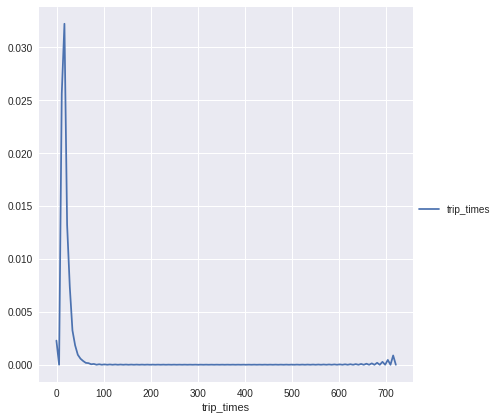

In [11]:

sns.FacetGrid(frame_with_durations_outliers_removed,size=6) \
  .map(sns.kdeplot, "trip_times") \
  .add_legend();
plt.show();

### Outlier Trip Distances:

## Outlier Dropoff and pickup points:
#### To simplify things new york has been divided into 37km x 37km box and any pickups or dropoffs outside this point is referred to as an outlier
1. There are 264.4k dropoffs happening outside of new york
2. There are 247.742 pickups happening outside of new york
3. How many travels have both drop off and pick ups outside of new york??
  - sdfsd

### Inspecting number of pickups shared among each of the vendors

In [12]:
#Get unique vendors
vendor_unique = frame_with_durations_outliers_removed.VendorID.unique()
Vendors = []
#Get the number of trips for each vendor
Vendors.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['VendorID'] == 1].shape[0])
Vendors.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['VendorID'] == 2].shape[0])
#Names of vendors
print "Unique vendors\n {}: Creative Mobile Technologies\n {}: VeriFone Inc\n".format(vendor_unique[1],vendor_unique[0])
print "Vendor 1 and Vendor 2 count:\n",Vendors

Unique vendors
 1: Creative Mobile Technologies
 2: VeriFone Inc

Vendor 1 and Vendor 2 count:
[5886898, 6558956]


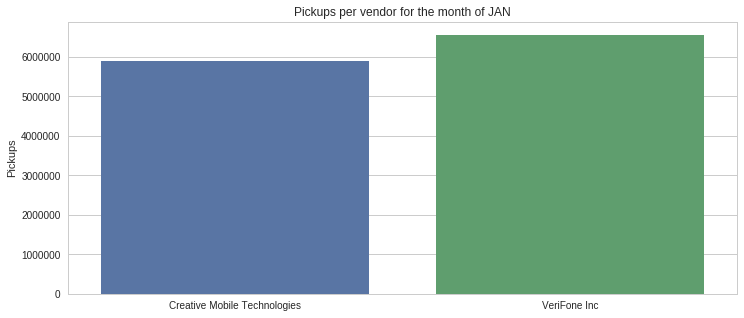

In [13]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = ['Creative Mobile Technologies', 'VeriFone Inc'] , y = np.array(Vendors))
ax.set(ylabel='Pickups')
sns.plt.title('Pickups per vendor for the month of JAN')
plt.show()

In [14]:
print "Creative Mobile Technologies share :{} % VeriFone Inc share :{} % ".format(100*float(Vendors[1])/sum(Vendors),100*float(Vendors[0])/sum(Vendors))

Creative Mobile Technologies share :52.6999272207 % VeriFone Inc share :47.3000727793 % 


### Both the vendors share almost same number of pickups in JAN month

In [15]:
#Get the number of pickups per each passenger count
passenger_count = []
passenger_uniq = set(frame_with_durations_outliers_removed['passenger_count'].values)
for i in passenger_uniq:
    passenger_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['passenger_count'] == i].shape[0])

#sort the passenger pickups based on the passenger count
pass_count_pickups = [x for _,x in sorted(zip(passenger_uniq,passenger_count))]
pass_count = [int(y) for y,_ in sorted(zip(passenger_uniq,passenger_count))]

print pass_count
print pass_count_pickups

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[6108, 8763645, 1772064, 517314, 247528, 689650, 449524, 7, 7, 7]


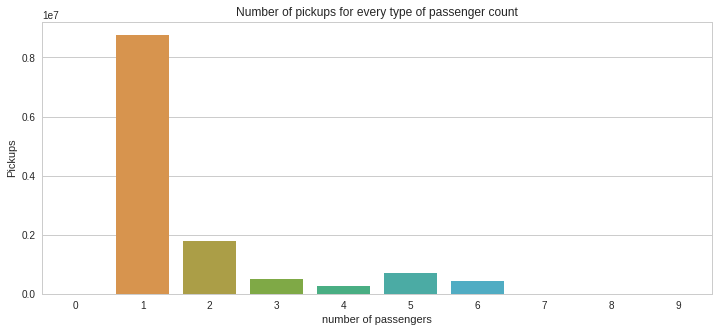

In [16]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(pass_count) , y = np.array(pass_count_pickups))
ax.set(ylabel='Pickups',xlabel = 'number of passengers')
sns.plt.title('Number of pickups for every type of passenger count')
plt.show()

In [17]:
for a,b in zip(pass_count,pass_count_pickups):
    print "Pickups for passenger count {} : {}% of total pickups".format(int(a),round(float(b)*100/sum(pass_count_pickups),4))

Pickups for passenger count 0 : 0.0491% of total pickups
Pickups for passenger count 1 : 70.4142% of total pickups
Pickups for passenger count 2 : 14.2382% of total pickups
Pickups for passenger count 3 : 4.1565% of total pickups
Pickups for passenger count 4 : 1.9888% of total pickups
Pickups for passenger count 5 : 5.5412% of total pickups
Pickups for passenger count 6 : 3.6118% of total pickups
Pickups for passenger count 7 : 0.0001% of total pickups
Pickups for passenger count 8 : 0.0001% of total pickups
Pickups for passenger count 9 : 0.0001% of total pickups


## Inference from the passenger count:
1. Majority of the trips seem to have 1 as the ideal number of passengers with 2 as the close second
2. What do the passenger count with 0 say?
  - Human error? - 
  - Maybe some form of goods delivery?
3. According to the TLC regulations 5 is the maximum number of passengers allowed in a yellow taxi
  - Good amount of trips have more than 5 passengers - almost 45k of them
  - Toddlers and children below age 7 are allowed to sit on laps
  - Maybe the drivers take into account the toddlers too(But still 7 ,8 and 9 are ridiculous numbers for passenger counts)

## Passenger Counts:
1. Standard rate
2. JFK
3. Newark
4. Nassau or Westchester
5. Negotiated fare
6. Group ride

In [18]:
#Unique rate codes
rate_codes_uniq = set(frame_with_durations_outliers_removed['RateCodeID'].values)
rate_count = []
for i in rate_codes_uniq:
    rate_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['RateCodeID'] == i].shape[0])
#sort the pickups based on the rate codes
rate_code_pickups = [x for _,x in sorted(zip(rate_codes_uniq,rate_count))]
rate_code = [int(y) for y,_ in sorted(zip(rate_codes_uniq,rate_count))]
Trips = ['Standard rates','JFK trips','Newark trips','Nassau/Westchester trips','Negotiated fare','Group rides','unknownrate code']


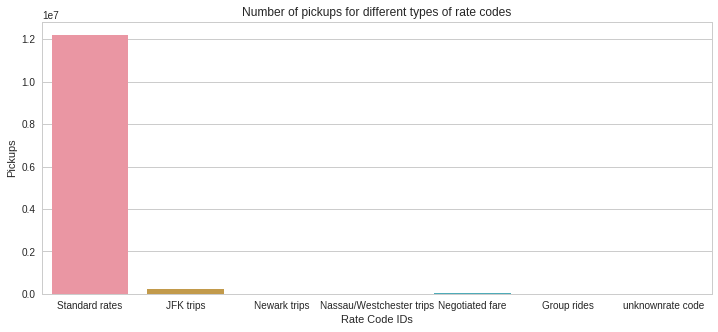

In [19]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(Trips) , y = np.array(rate_code_pickups))
ax.set(ylabel='Pickups',xlabel = 'Rate Code IDs')
sns.plt.title('Number of pickups for different types of rate codes')
plt.show()

In [20]:
for a,b in zip(Trips,rate_code_pickups):
    print "Pickups for/with {} accounts {}% of total pickups".format(a,round(float(b)*100/sum(rate_code_pickups),4))

Pickups for/with Standard rates accounts 98.0546% of total pickups
Pickups for/with JFK trips accounts 1.7415% of total pickups
Pickups for/with Newark trips accounts 0.0152% of total pickups
Pickups for/with Nassau/Westchester trips accounts 0.0144% of total pickups
Pickups for/with Negotiated fare accounts 0.1706% of total pickups
Pickups for/with Group rides accounts 0.001% of total pickups
Pickups for/with unknownrate code accounts 0.0027% of total pickups


## Rate Codes:

1. Standard rate - 12.4 Million trips
2. JFK - 224.2k trips
3. Newark - 17.7k trips
4. Nassau or Westchester - 4.1k trips
5. Negotiated fare - 36.8k trips
6. Group ride - 134 trips
7. rate code 99(mistake??) - 507 trips

### Store and forward flags

In [21]:
SWflag_uniq = set(frame_with_durations_outliers_removed['store_and_fwd_flag'].values)
SWflag_count = []
for i in SWflag_uniq :
    SWflag_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['store_and_fwd_flag'] == i].shape[0])
print SWflag_count
SWflag_uniq = list(SWflag_uniq)
print SWflag_uniq

[107220, 12338634]
['Y', 'N']


In [22]:
for a,b in zip(SWflag_uniq,SWflag_count):
    print "Pickups for/with store and forward = {} accounts {}% of total pickups".format(a,round(float(b)*100/sum(SWflag_count),4))

Pickups for/with store and forward = Y accounts 0.8615% of total pickups
Pickups for/with store and forward = N accounts 99.1385% of total pickups


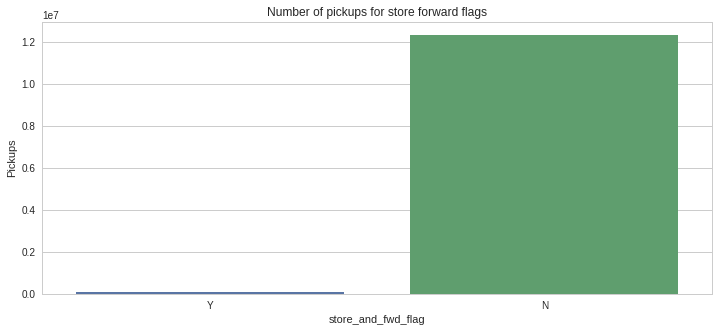

In [23]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(SWflag_uniq) , y = np.array(SWflag_count))
ax.set(ylabel='Pickups',xlabel = 'store_and_fwd_flag')
sns.plt.title('Number of pickups for store forward flags')
plt.show()

## Payment types:
1. Credit card
2. Cash
3. No charge
4. Dispute
5. Unknown
6. Voided trip

In [24]:
payment_uniq = set(frame_with_durations_outliers_removed['payment_type'].values)
payment_count = []
for i in payment_uniq :
    payment_count.append(frame_with_durations_outliers_removed[frame_with_durations_outliers_removed['payment_type'] == i].shape[0])
print payment_count
payment_uniq = list(payment_uniq)
print payment_uniq

[7704058, 4693949, 36615, 11230, 2]
[1, 2, 3, 4, 5]


In [25]:
pay_pickups = [x for _,x in sorted(zip(payment_uniq,payment_count))]
pay = [int(y) for y,_ in sorted(zip(payment_uniq,payment_count))]
pay_type = ['Credit card','Cash','No charge','Dispute','Unknow']

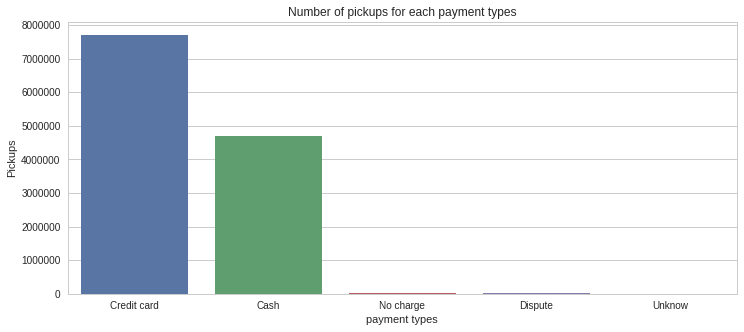

In [26]:
sns.set_style("whitegrid")

fig, ax = plt.subplots()
fig.set_size_inches(12, 5)

ax = sns.barplot(x = np.array(pay_type) , y = np.array(pay_pickups))
ax.set(ylabel='Pickups',xlabel = 'payment types')
sns.plt.title('Number of pickups for each payment types')
plt.show()

In [27]:
for a,b in zip(pay_type,pay_pickups):
    print "Pickups with payment types {} accounts to :{}% of total pickups".format(a,round(float(b)*100/sum(pay_pickups),4))

Pickups with payment types Credit card accounts to :61.9006% of total pickups
Pickups with payment types Cash accounts to :37.715% of total pickups
Pickups with payment types No charge accounts to :0.2942% of total pickups
Pickups with payment types Dispute accounts to :0.0902% of total pickups
Pickups with payment types Unknow accounts to :0.0% of total pickups


## Pickup and dropoff locations on maps:

/home/darshan_excellence/.local/lib/python2.7/site-packages/ipykernel_launcher.py:17: FutureWarning: 
mpl_style had been deprecated and will be removed in a future version.
Use `matplotlib.pyplot.style.use` instead.

/home/darshan_excellence/.local/lib/python2.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  
/home/darshan_excellence/.local/lib/python2.7/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family [u'monospace'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


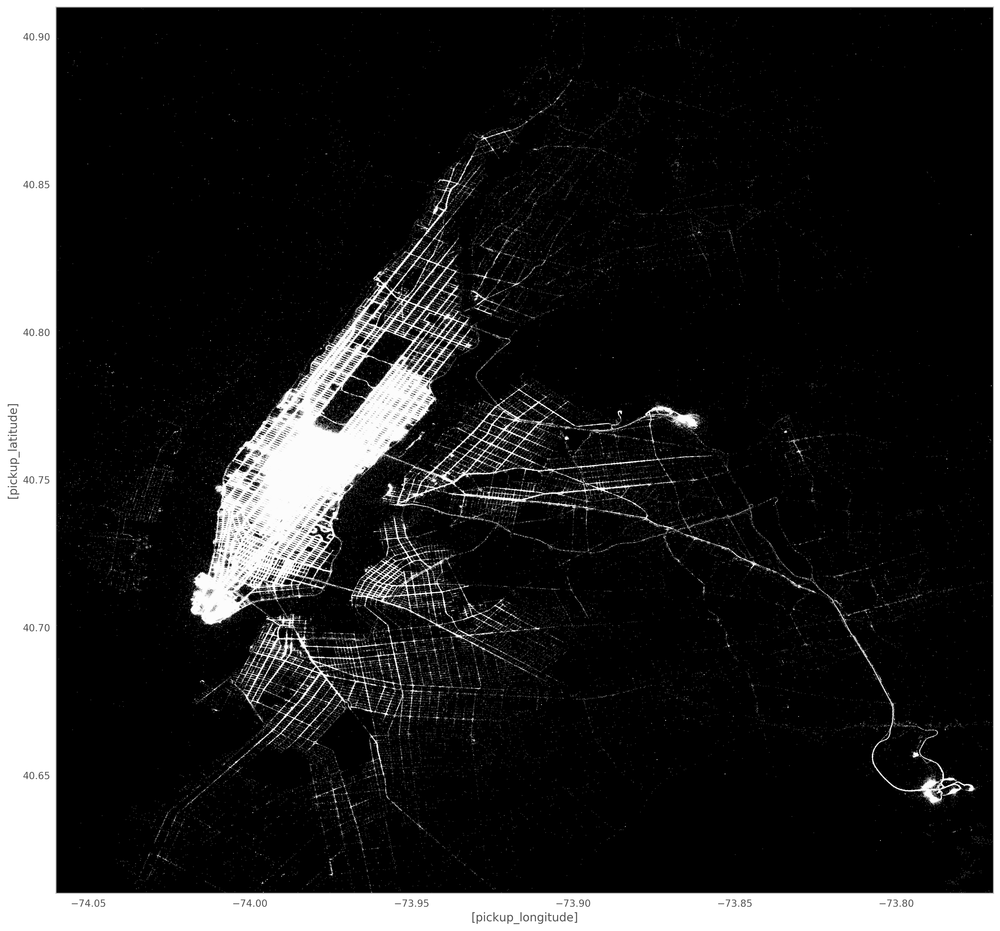

In [28]:
#The scatter plot of pickup locations for the month of january
#Inline Plotting for Ipython Notebook 
def plot_scatter_pickup(frame):
    %matplotlib inline 

    pd.options.display.mpl_style = 'default' #Better Styling  
    new_style = {'grid': False} #Remove grid  
    matplotlib.rc('axes', **new_style)  
    rcParams['figure.figsize'] = (17.5, 17) #Size of figure  
    rcParams['figure.dpi'] = 250


    P=frame.plot(kind='scatter', x=['pickup_longitude'], y=['pickup_latitude'],color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
    P.set_axis_bgcolor('black') #Background Color
    plt.show()

plot_scatter_pickup(frame_with_durations_outliers_removed)

/home/darshan_excellence/.local/lib/python2.7/site-packages/ipykernel_launcher.py:14: FutureWarning: 
mpl_style had been deprecated and will be removed in a future version.
Use `matplotlib.pyplot.style.use` instead.

  
/home/darshan_excellence/.local/lib/python2.7/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  if sys.path[0] == '':


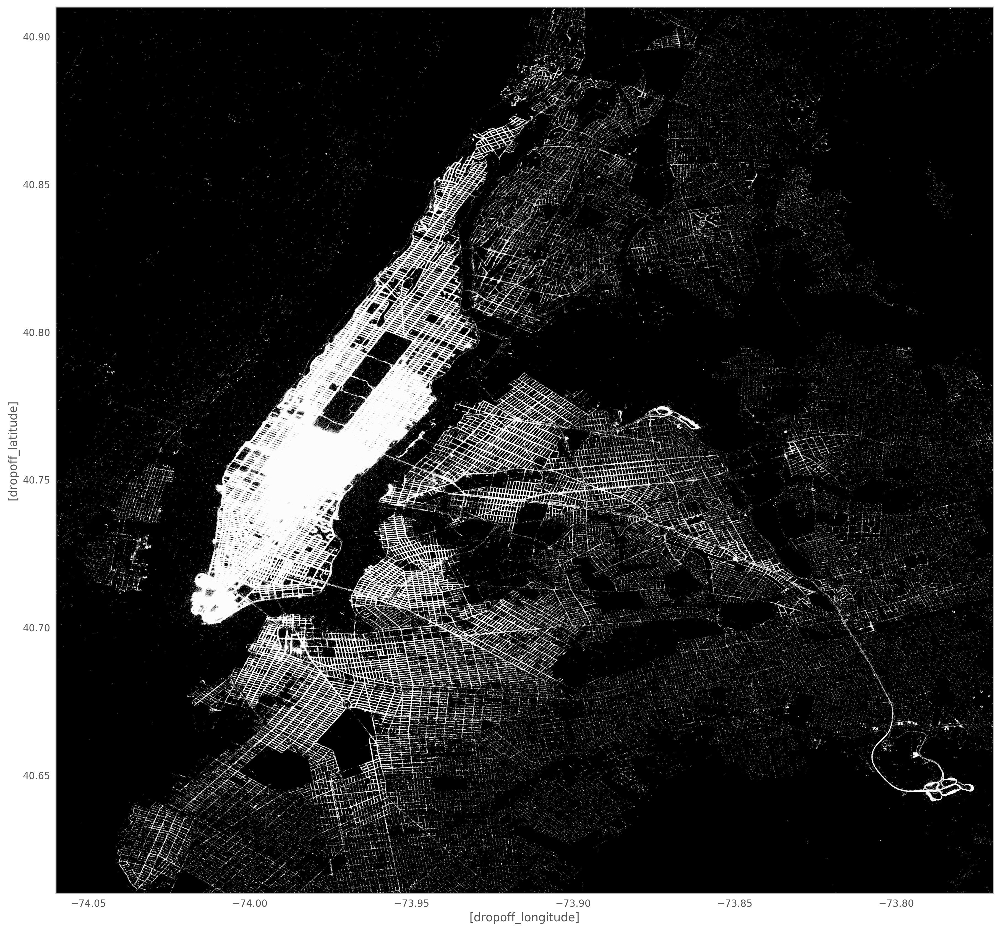

In [29]:
def plot_scatter_dropoff(frame):
    %matplotlib inline 

    pd.options.display.mpl_style = 'default' #Better Styling  
    new_style = {'grid': False} #Remove grid  
    matplotlib.rc('axes', **new_style)  
    rcParams['figure.figsize'] = (17.5, 17) #Size of figure  
    rcParams['figure.dpi'] = 250


    P=frame.plot(kind='scatter', x=['dropoff_longitude'], y=['dropoff_latitude'],color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
    P.set_axis_bgcolor('black') #Background Color

plot_scatter_dropoff(frame_with_durations_outliers_removed)

### INFERENCE:
1. The pickup locations seem to be concentrated in the manhattan area
2. The dropoff locations seem to be spread over the brooklyn and queens as will along with the manhattan area

## Pickup densities and places with most revenues for 5 locations in new york(or break it up into more regions covering all areas):
1. Brooklyn
2. Queens 
3. Manhattan
4. The Bronx 
5. Staten Island 

In [30]:
def compute_pickups_per_day():
    time = month_1[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'])
    time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
    time["pickup_hour"] = time['tpep_pickup_datetime'].dt.strftime('%H').astype(int)
    set(time['pickup_day'].values)
    day_pickups = []
    night_pickups = []
    mid_night_pickups = []
    for i in range(1,8):
        day_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 6) & (time.pickup_hour < 19)].shape[0])
        night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 19) & (time.pickup_hour <= 23)].shape[0])
        mid_night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 0) & (time.pickup_hour < 6)].shape[0])
    
    days =pd.DataFrame({'morning':day_pickups, 'night':night_pickups, 'midnight':mid_night_pickups})
    days.plot(kind='bar', stacked=True,figsize=(3, 3))
    plt.xlabel('Days of the week')
    plt.ylabel('Number of pickups')
    plt.tick_params(axis='both', which='minor', labelsize=2)
    plt.plot()
    #plt.xticks(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    for i in range(0,len(days)):
        print "{} -  morning:{} , day:{} , night:{}".format(days[i],mid_night_pickups[i],day_pickups[i],night_pickups[i])
    
    return time

Monday -  morning:108576 , day:925265 , night:299030
Tuesday -  morning:76339 , day:886747 , night:410836
Wednesday -  morning:104280 , day:1083599 , night:496108
Thursday -  morning:260968 , day:1285071 , night:622174
Friday -  morning:200685 , day:1319619 , night:706883
Saturday -  morning:433710 , day:1267043 , night:678955
Sunday -  morning:377923 , day:889012 , night:316163


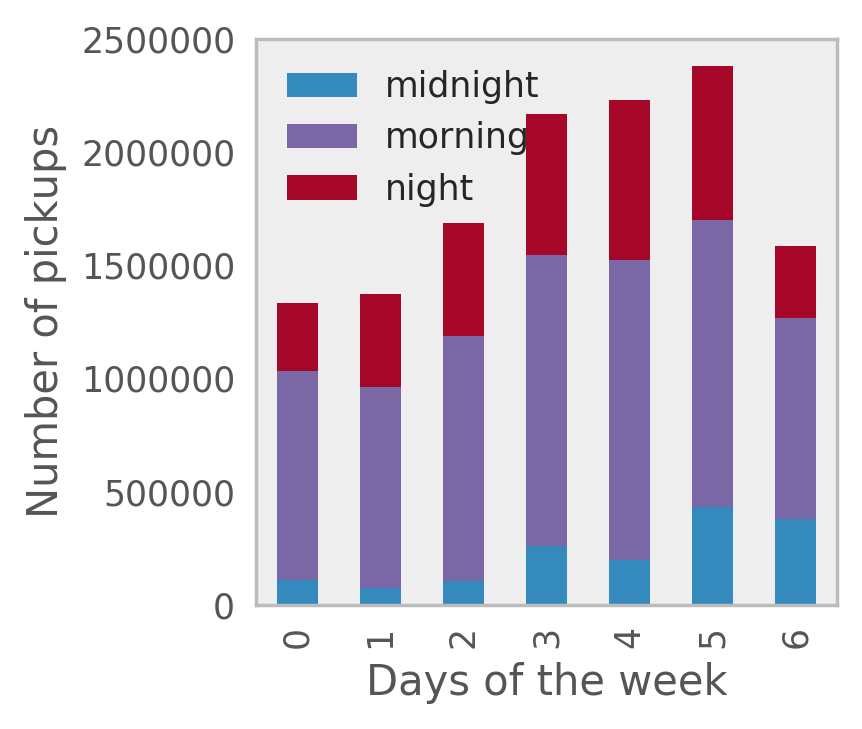

In [31]:
times_of_day_dframe = compute_pickups_per_day()

## Inference:
1. More commute happens during the day[6:00 to 18:59 hrs] time compared to the night[19:00 to 23:59 hrs] or morning[00:00 to 5:59 hrs]
2. Saturday seems to be the busiest days for the taxi drivers overall
3. Most midnight commutes happen on saturdays 
4. Interestingly more commute happens during the midnight compared to on sunday than on saturday
5. Midnight commute during on saturdays are the highest and consecutively friday night commutes seem to be the highest(Friday night parties)

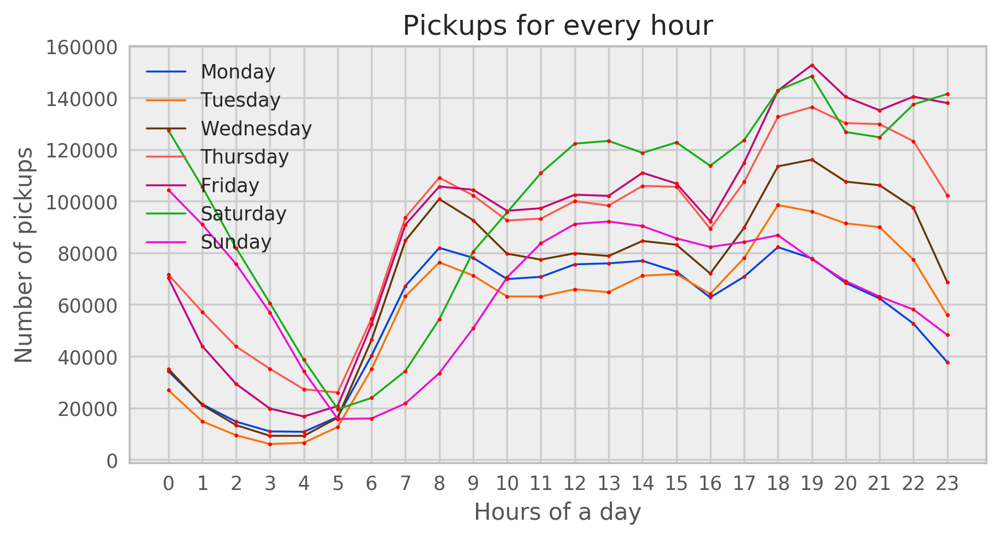

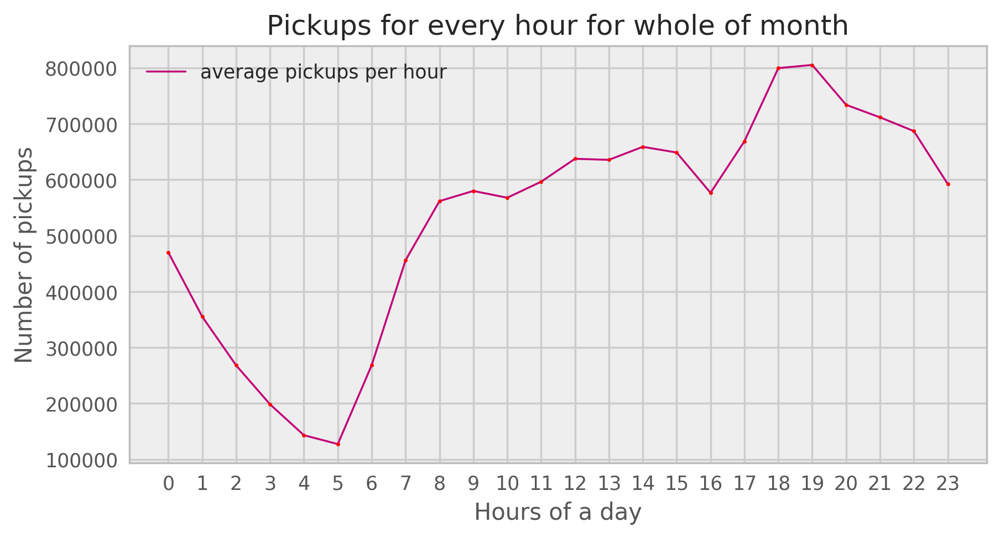

In [32]:
#pickups and distances travelled at what time of the day??
def pickup_in_day(frame):
    hour_pickups = []
    temp = []
    for i in range(1,8):
        for j in range(0,24):
            temp.append(frame[(frame.pickup_day == i) & (frame.pickup_hour == j)].shape[0])
        hour_pickups.append(temp)
        temp = []
    colors = ['xkcd:blue','xkcd:orange','xkcd:brown','xkcd:coral','xkcd:magenta','xkcd:green','xkcd:fuchsia']
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    for k in range(0,7):
        plt.plot(hours_lis,hour_pickups[k],colors[k],label = days[k])
        plt.plot(hours_lis,hour_pickups[k], 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    hour_pickup_month = []
    for j in range(0,24):
        hour_pickup_month.append(frame[frame.pickup_hour == j].shape[0])

    plt.figure(figsize=(8,4))
    hours_lis = [s for s in range(0,24)]
    plt.plot(hours_lis,hour_pickup_month,'xkcd:magenta',label = 'average pickups per hour')
    plt.plot(hours_lis,hour_pickup_month, 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour for whole of month')
    plt.legend()
    plt.grid(True)
    plt.show()

pickup_in_day(times_of_day_dframe)

### Clustering of regions:

In [33]:
frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)

In [34]:
#Find the best cluster where least number of clusters have a min. radius of atleast 1km or more
coords = np.vstack((frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values,
                    frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values))

def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    for i in range(0, cluster_len-1):
        min_value = 1000000
        for j in range(i+1, cluster_len):
            min_value = min(min_value, gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],cluster_centers[j][0], cluster_centers[j][1]))
        if min_value!=1000000 and (min_value/1000) >= 1:
            nice_points +=1
        else:
            wrong_points += 1
    print (cluster_len, "Cents with min distance < 1:", wrong_points, "Cents with min distance > 1:", nice_points)

    if nice_points == cluster_len-1:
        return 1
    else:
        return 0

def find_clusters(increment):
    kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000).fit(coords)
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    cluster_centers = kmeans.cluster_centers_
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len

for increment in range(10, 100, 10):
    cluster_centers, cluster_len = find_clusters(increment)
    more_than_5km = find_min_distance(cluster_centers, cluster_len)            

(10, 'Cents with min distance < 1:', 0, 'Cents with min distance > 1:', 9)
(20, 'Cents with min distance < 1:', 1, 'Cents with min distance > 1:', 18)
(30, 'Cents with min distance < 1:', 8, 'Cents with min distance > 1:', 21)
(40, 'Cents with min distance < 1:', 9, 'Cents with min distance > 1:', 30)
(50, 'Cents with min distance < 1:', 20, 'Cents with min distance > 1:', 29)
(60, 'Cents with min distance < 1:', 28, 'Cents with min distance > 1:', 31)
(70, 'Cents with min distance < 1:', 36, 'Cents with min distance > 1:', 33)
(80, 'Cents with min distance < 1:', 46, 'Cents with min distance > 1:', 33)
(90, 'Cents with min distance < 1:', 56, 'Cents with min distance > 1:', 33)


### Inference:
- The main objective was to find a optimal min. distance(Which roughly estimates to the radius of a cluster) between the clusters which we got was 40

In [35]:
#Getting 40 clusters using the kmeans 
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

In [36]:
#Adding a new column describing what cluster the pickup point belongs to
frame_with_durations_outliers_removed.head(5)

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,trip_times,pickup_times,lat_bin,lon_bin,pickup_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,18.050000,1.421329e+09,40.7501,-73.9939,0
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,1,N,19.833333,1.420902e+09,40.7242,-74.0016,31
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,10.050000,1.420902e+09,40.8028,-73.9633,17
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,1.866667,1.420902e+09,40.7138,-74.0091,26
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,19.316667,1.420902e+09,40.7624,-73.9712,6


In [37]:
#Plotting the cluster centers on OSM
cluster_centers = kmeans.cluster_centers_
cluster_len = len(cluster_centers)
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')
for i in range(cluster_len):
    folium.Marker(list((cluster_centers[i][0],cluster_centers[i][1])), popup=(str(cluster_centers[i][0])+str(cluster_centers[i][1]))).add_to(map_osm)
map_osm

### Plotting the clusters:

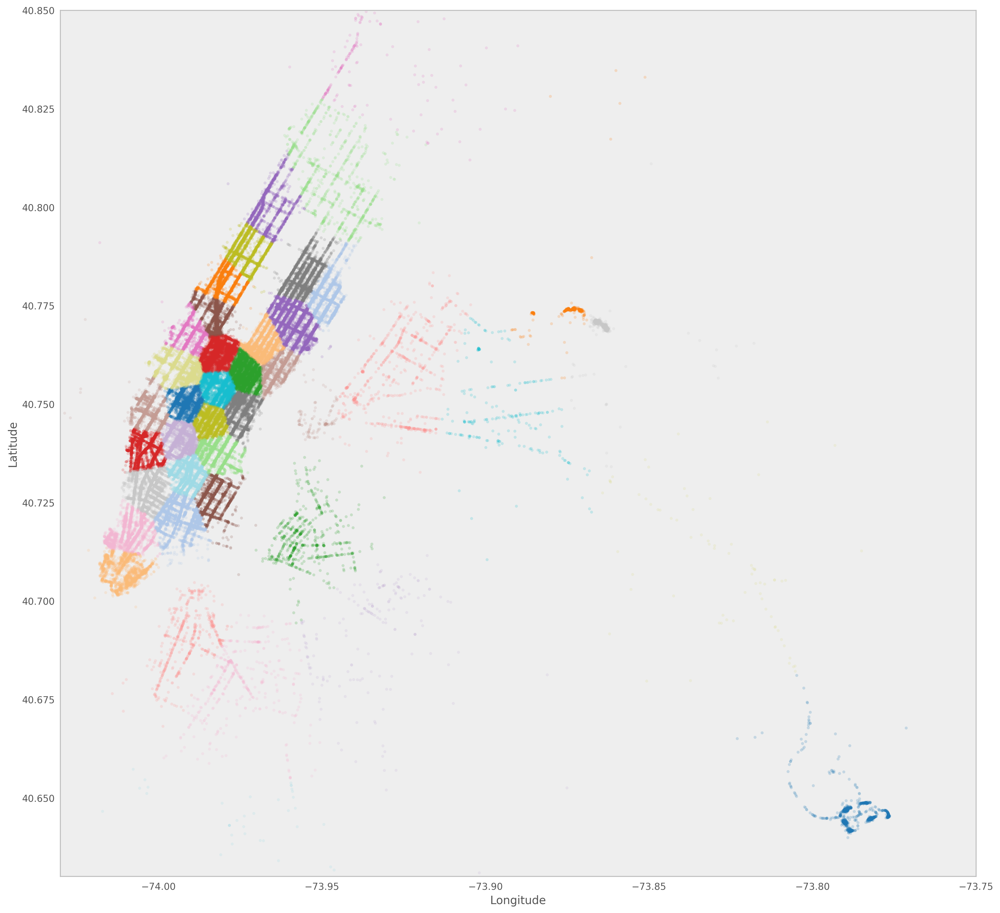

In [38]:
def plot_clusters(frame):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)
    fig, ax = plt.subplots(ncols=1, nrows=1)
    ax.scatter(frame.pickup_longitude.values[:100000], frame.pickup_latitude.values[:100000], s=10, lw=0,
               c=frame.pickup_cluster.values[:100000], cmap='tab20', alpha=0.2)
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()

plot_clusters(frame_with_durations_outliers_removed)

In [39]:
frame_with_durations_outliers_removed.head()

,VendorID,payment_type,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,RateCodeID,store_and_fwd_flag,trip_times,pickup_times,lat_bin,lon_bin,pickup_cluster
0,2,1,1,1.59,-73.993896,40.750111,-73.974785,40.750618,1,N,18.050000,1.421329e+09,40.7501,-73.9939,0
1,1,1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,1,N,19.833333,1.420902e+09,40.7242,-74.0016,31
2,1,2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,1,N,10.050000,1.420902e+09,40.8028,-73.9633,17
3,1,2,1,0.50,-74.009087,40.713818,-74.004326,40.719986,1,N,1.866667,1.420902e+09,40.7138,-74.0091,26
4,1,2,1,3.00,-73.971176,40.762428,-74.004181,40.742653,1,N,19.316667,1.420902e+09,40.7624,-73.9712,6


In [63]:
#This part is enough to obtain the 
month_1 = dd.read_csv('yellow_tripdata_2015-01.csv')

def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())

#return a dataframe with many parameters along with trip duration and trip pickup times(with outliers)
def return_with_trip_times():
    duration = month_1[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    #pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    #calculate duration of trips
    print "calculating trip durations..."
    duration_pickup = np.array(duration_pickup)
    duration_drop = np.array(duration_drop)
    durations = duration_drop - duration_pickup
    durations = durations/float(60)
    #create a pandas dataframeof durations and pickups
    print "appending trip durations..."
    
    duration_dataframe = pd.DataFrame({'trip_times': durations})
    pickup_dataframe = pd.DataFrame({'pickup_times' : duration_pickup})
    #append durations of trips and pickup times in unix to a new dataframe
    new_frame = month_1[['VendorID','payment_type','passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','RateCodeID','store_and_fwd_flag']].compute()
    new_frame.reset_index(drop=True, inplace=True)
    duration_dataframe.reset_index(drop=True, inplace=True)
    pickup_dataframe.reset_index(drop = True, inplace = True)
    new_frame = pd.concat([new_frame,duration_dataframe,pickup_dataframe],axis = 1)
    
    return new_frame
#duration_dropoff
print "removing outliers durations..."
#outliers aren't still removed
#dataframe with durations and pickup unix time appended
frame_with_durations = return_with_trip_times()

#remove outliers
def remove_outliers(new_frame):
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    
    return new_frame

frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)

print "clustering the pickup locations using kmeans..."
#Add two new columns
frame_with_durations_outliers_removed['lat_bin'] = np.round(frame_with_durations_outliers_removed['pickup_latitude'],4)
frame_with_durations_outliers_removed['lon_bin'] = np.round(frame_with_durations_outliers_removed['pickup_longitude'],4)

#vertically append
coords = np.vstack((frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values,
                    frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values))

#Getting 40 clusters using the kmeans and for each point find the clusters
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

print "binning trip durations into 10 minutes..."
#Add the pickup time bins
def add_pickup_bins(frame):
    unix_pickup_times=[i for i in frame['pickup_times'].values]
    start_pickup_unix=min(unix_pickup_times)
    tenminutewise_binned_unix_pickup_times=[int((i-start_pickup_unix)/600) for i in unix_pickup_times]
    frame_with_durations_outliers_removed['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
    return frame_with_durations_outliers_removed

print "groupby to get pickup density..."
    
final_updated_frame = add_pickup_bins(frame_with_durations_outliers_removed)
final_groupby_frame = final_updated_frame[['pickup_cluster','pickup_bins','payment_type']].groupby(['pickup_cluster','pickup_bins']).count()['payment_type'].values

In [74]:
final_updated_frame[['pickup_cluster','pickup_bins','payment_type']].groupby(['pickup_cluster','pickup_bins']).count()

payment_type
pickup_cluster pickup_bins              
0              0                      82
               1                     181
               2                     176
               3                     186
               4                     147
               5                     156
               6                     163
               7                     121
               8                     116
               9                     129
               10                    134
               11                    111
               12                     97
               13                     94
               14                    113
               15                    115
               16                    134
               17                    114
               18                    120
               19                    116
               20                    103
               21                    105
               22                     78
               23                     68
               24                     67
               25                     52
               26                     68
               27                     54
               28                     30
               29                     33
...                                  ...
39             4434                   23
               4435                   23
               4436                   27
               4437                   22
               4438                   24
               4439                   24
               4440                   18
               4441                   27
               4442                   23
               4443                   19
               4444                   12
               4445                   11
               4446                   18
               4447                   13
               4448                   14
               4449                   20
               4450                   15
               4451                   15
               4452                   15
               4453                   19
               4454                   18
               4455                   22
               4456                   19
               4457                   14
               4458                   21
               4459                   19
               4460                   27
               4461                   27
               4462                   21
               4463                   24

[175133 rows x 1 columns]

In [48]:
def add_pickup_bins(frame):
    unix_pickup_times=[i for i in frame['pickup_times'].values]
    start_pickup_unix=min(unix_pickup_times)
    tenminutewise_binned_unix_pickup_times=[int((i-start_pickup_unix)/600) for i in unix_pickup_times]
    frame_with_durations_outliers_removed['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
    return frame_with_durations_outliers_removed

final_updated_frame = add_pickup_bins(frame_with_durations_outliers_removed)

In [60]:
a  = final_updated_frame[['pickup_cluster','pickup_bins','payment_type']].groupby(['pickup_cluster','pickup_bins']).count()['payment_type'].values

In [62]:
print len(a)/40

4329


In [ ]:
def get_updated_frame